#Paquete inicial

In [ ]:
!pip install -U --pre tensorflow=="2.2.0"

ERROR: Could not find a version that satisfies the requirement tensorflow==2.2.0 (from versions: 2.8.0rc0, 2.8.0rc1, 2.8.0, 2.8.1, 2.8.2, 2.8.3, 2.8.4, 2.9.0rc0, 2.9.0rc1, 2.9.0rc2, 2.9.0, 2.9.1, 2.9.2, 2.9.3, 2.10.0rc0, 2.10.0rc1, 2.10.0rc2, 2.10.0rc3, 2.10.0, 2.10.1, 2.11.0rc0, 2.11.0rc1, 2.11.0rc2, 2.11.0, 2.11.1, 2.12.0rc0, 2.12.0rc1, 2.12.0, 2.12.1, 2.13.0rc0, 2.13.0rc1, 2.13.0rc2, 2.13.0, 2.14.0rc0, 2.14.0rc1)
ERROR: No matching distribution found for tensorflow==2.2.0


In [ ]:
import numpy as np
np.__version__

'1.23.5'

In [ ]:
pip install PyYAML=="5.1"


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 3.2 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.


In [ ]:
pip install pillow=="9.5"

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 10.5 MB/s eta 0:00:00
  Attempting uninstall: pillow
    Found existing installation: Pillow 9.4.0
    Uninstalling Pillow-9.4.0:
      Successfully uninstalled Pillow-9.4.0


In [ ]:
pip install -U numpy=="1.23.5"

In [ ]:
import os
import pathlib

# Clone the tensorflow models repository if it doesn't already exist
if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path('models').exists():
  !git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 3984, done.
remote: Counting objects: 100% (3984/3984), done.
remote: Compressing objects: 100% (3096/3096), done.
remote: Total 3984 (delta 1149), reused 1963 (delta 831), pack-reused 0
Receiving objects: 100% (3984/3984), 49.76 MiB | 24.15 MiB/s, done.
Resolving deltas: 100% (1149/1149), done.
Updating files: 100% (3599/3599), done.


In [ ]:
import os
import pathlib

# Clone the tensorflow models repository if it doesn't already exist
if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path('models').exists():
  !git clone --depth 1 https://github.com/tensorflow/models

In [ ]:
# Install the Object Detection API
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
python -m pip install .

Processing /content/models/research
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.7/14.7 MB 23.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 29.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 28.8/28.8 MB 19.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 4.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.6/116.6 kB 10.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 55.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 3.9 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 241.2/241.2 kB 21.8 MB/s eta 0:00:00
     ━━━━━━━━━━━

In [ ]:
import matplotlib
import matplotlib.pyplot as plt

import cv2
import os
import random
import io
import imageio
import glob
import scipy.misc
import numpy as np
from six import BytesIO
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display, Javascript
from IPython.display import Image as IPyImage
import PIL.ImageOps
import tensorflow as tf



In [ ]:
from object_detection.utils import label_map_util
from object_detection.utils import config_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.utils import colab_utils
from object_detection.builders import model_builder

%matplotlib inline

In [ ]:
def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: a file path.

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  img_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(img_data))
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

def load_image_into_numpy_array(path,color=1):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: a file path.

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  img_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(img_data))
  (im_width, im_height) = image.size
  return np.array(image.getdata().convert('RGB')).reshape(
      (im_height, im_width,3)).astype(np.uint8)

def plot_detections(image_np,
                    boxes,
                    classes,
                    scores,
                    category_index,
                    figsize=(12, 16),
                    image_name=None):
  """Wrapper function to visualize detections.

  Args:
    image_np: uint8 numpy array with shape (img_height, img_width, 3)
    boxes: a numpy array of shape [N, 4]
    classes: a numpy array of shape [N]. Note that class indices are 1-based,
      and match the keys in the label map.
    scores: a numpy array of shape [N] or None.  If scores=None, then
      this function assumes that the boxes to be plotted are groundtruth
      boxes and plot all boxes as black with no classes or scores.
    category_index: a dict containing category dictionaries (each holding
      category index `id` and category name `name`) keyed by category indices.
    figsize: size for the figure.
    image_name: a name for the image file.
  """

  image_np_with_annotations = image_np.copy()
  viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_annotations,
      boxes,
      classes,
      scores,
      category_index,
      use_normalized_coordinates=True,
      min_score_thresh=0.2)
  if image_name:
    plt.imsave(image_name, image_np_with_annotations)
  else:
    plt.imshow(image_np_with_annotations)


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


#Test

In [ ]:
def Cargar_imagen(Name,Path):
  img=cv2.imread(os.path.join(Path, Name+".jpg"))
  img=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  return(img)

In [ ]:
# Graficar(img,pd.DataFrame(Data,columns=["Xmin","Ymin","Xmax","Ymax"]))
def Graficar(img,df):

  # Imagen Principal
  plt.clf()
  fig, ax = plt.subplots()
  final_image = Image.fromarray((img * 255).astype(np.uint8))
  # Impresión con escala para mejor visualizacion
  fig.set_size_inches(10, 10, forward=True)
  ax.imshow(final_image, cmap='gray', vmin=0, vmax=255)
  #
  #dibujar puntos de enfermedad
  img_height,img_width=np.array(img).shape[0],np.array(img).shape[1]
  # print(img_height,img_height)
  for i in df.index:
      # Create a Rectangle patch
      xmin= int((float(df["Xmin"][i])*img_width))
      ymin= int((float(df["Ymin"][i])*img_height))
      xmax= int((float(df["Xmax"][i])*img_width))
      ymax= int((float(df["Ymax"][i])*img_height))
      Width = xmax-xmin
      Height= ymax-ymin
      print(xmin,ymin,Width,Height)
#     Ver Imagen con Restricciones
      rect = patches.Rectangle((xmin,ymin), int(Width), int(Height), linewidth=2, edgecolor='r', facecolor='none')
      plt.text(xmin, ymin,str(i))
      ax.add_patch(rect)
  plt.show()

In [ ]:
#Generacion y cargado de los boxes

def Generador_data(Name,path):
  DF=[]
  with open(path+Name+".txt", 'r') as txt_file:
    df=txt_file.read()
  # print(df)
  df2=df.split("\n")
  # print(df2)
  for i in range(len(df2)):
    df3 = df2[i].split(" ")
    if (df3!=[]):
      DF.append(df3)
  DF.pop(-1)
  # print(DF)
  # print(len(DF))
  Data=pd.DataFrame(DF,columns=["Class","Xcenter","Ycenter","Width","Height"])
  # print(np.array(list(Data.values)))
  Data = Data.drop(["Class"], axis=1)
  return(np.array(list(Data.values), dtype='f'))

In [ ]:
import os
import numpy as np
BASE_FOLDER="/content/drive/MyDrive/Trabajo_final_VIU/YOLOV8/Dataset/test/"
Lista_imagenes = os.listdir(BASE_FOLDER+'images/')
Lista_imagenes.sort()
print("Números de imágenes con osteofitos y sin osteofitos detectados= "+str(len(Lista_imagenes)))


Números de imágenes con osteofitos y sin osteofitos detectados= 1664


640 602 31 39 153 195 184 234
640 602 46 24 169 276 215 300
153 195 31 39
169 276 46 24


<Figure size 640x480 with 0 Axes>

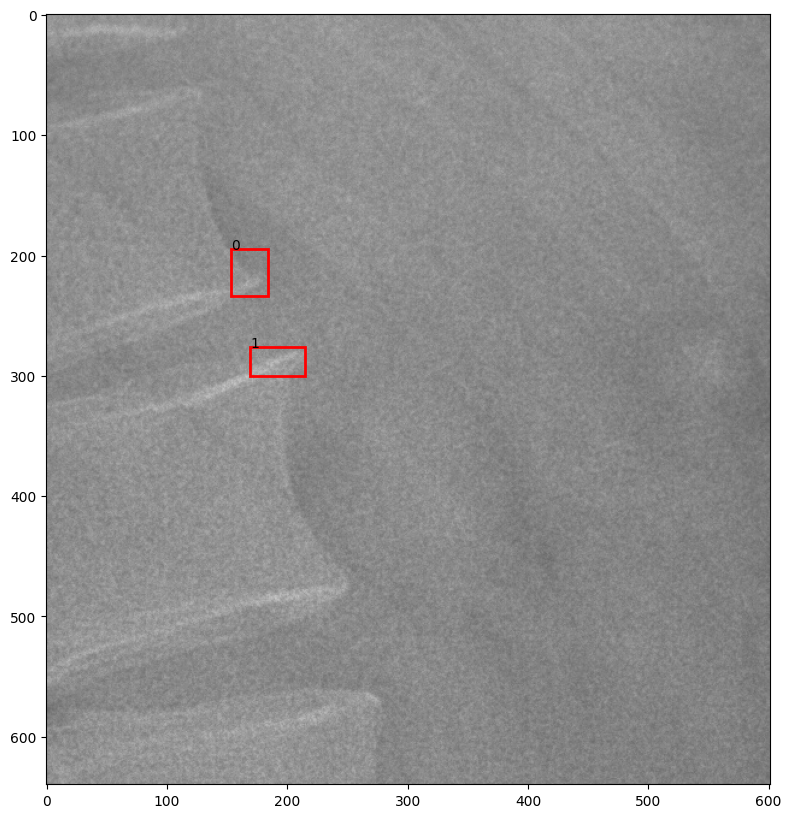

640 640 37 68 472 273 509 341
640 640 27 68 463 173 490 241
640 640 49 76 459 72 508 148
472 273 37 68
463 173 27 68
459 72 49 76


<Figure size 640x480 with 0 Axes>

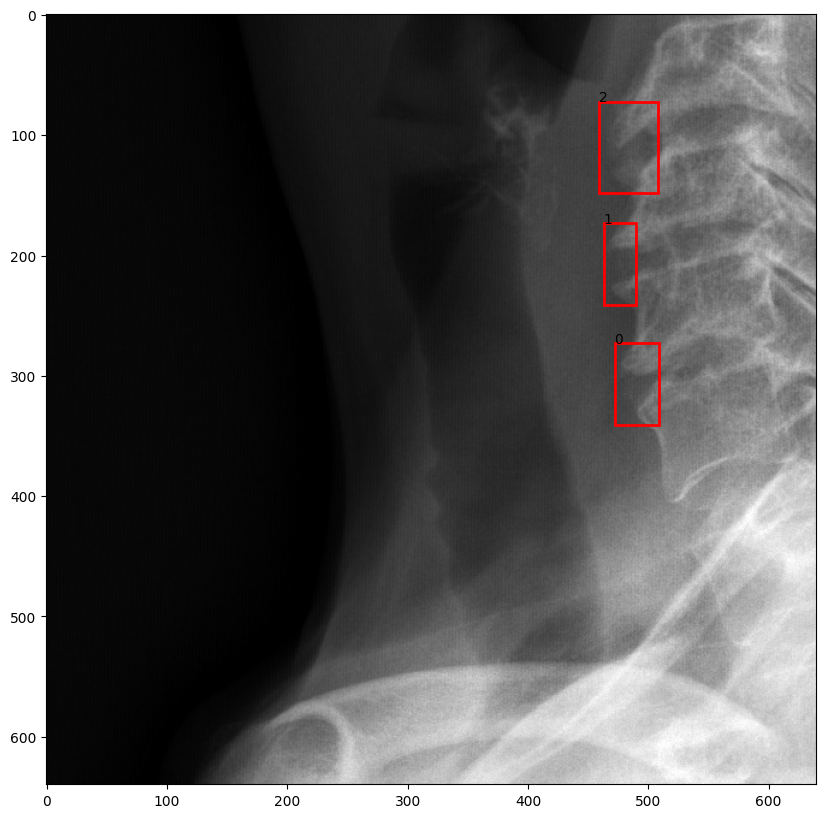

640 531 43 60 268 137 311 197
640 531 28 40 283 305 311 345
268 137 43 60
283 305 28 40


<Figure size 640x480 with 0 Axes>

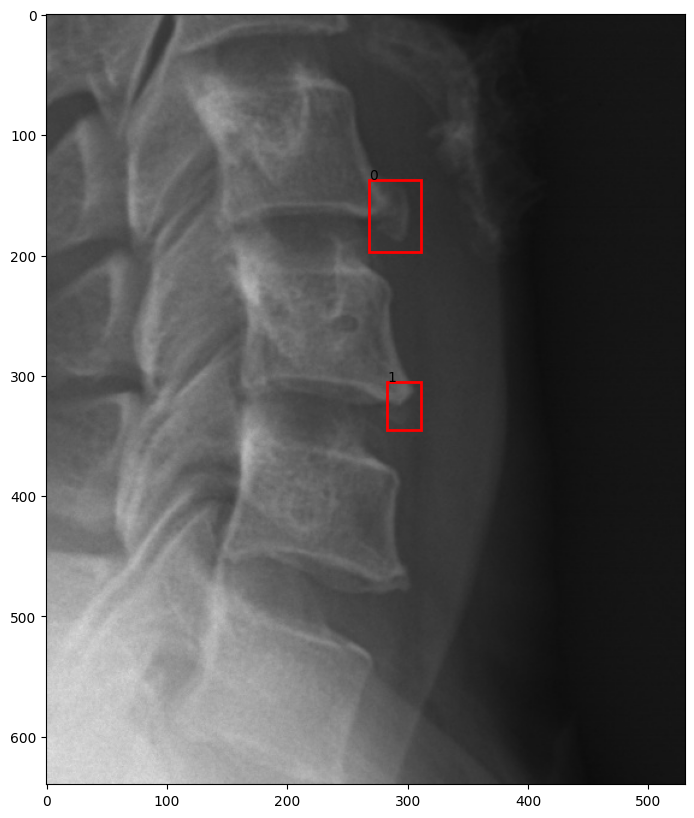

604 614 100 125 162 375 262 500
162 375 100 125


<Figure size 640x480 with 0 Axes>

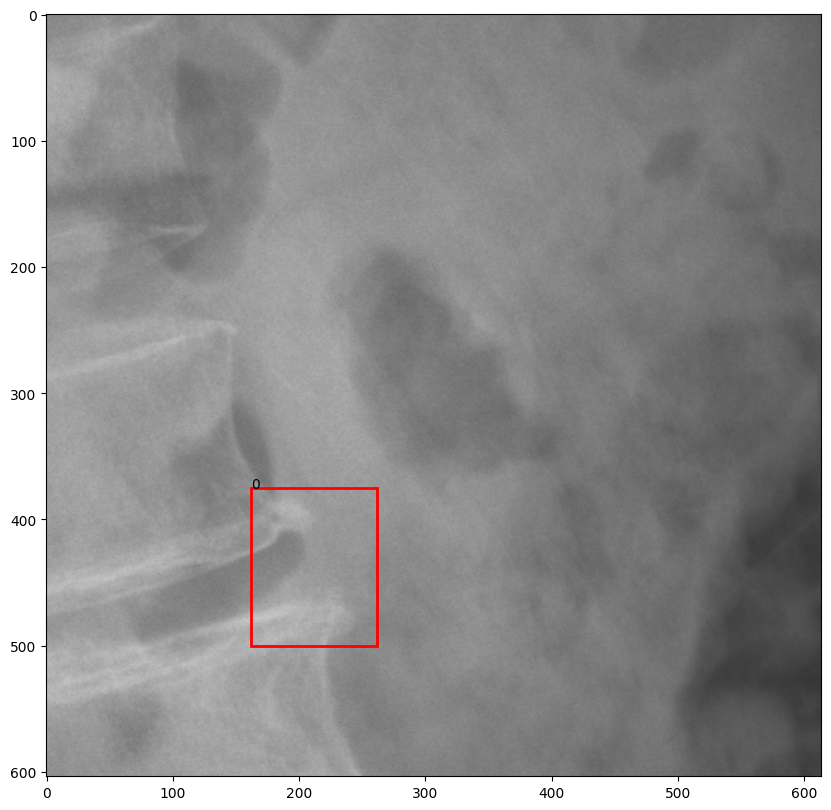

640 614 104 187 266 4 370 191
640 614 78 182 336 323 414 505
266 4 104 187
336 323 78 182


<Figure size 640x480 with 0 Axes>

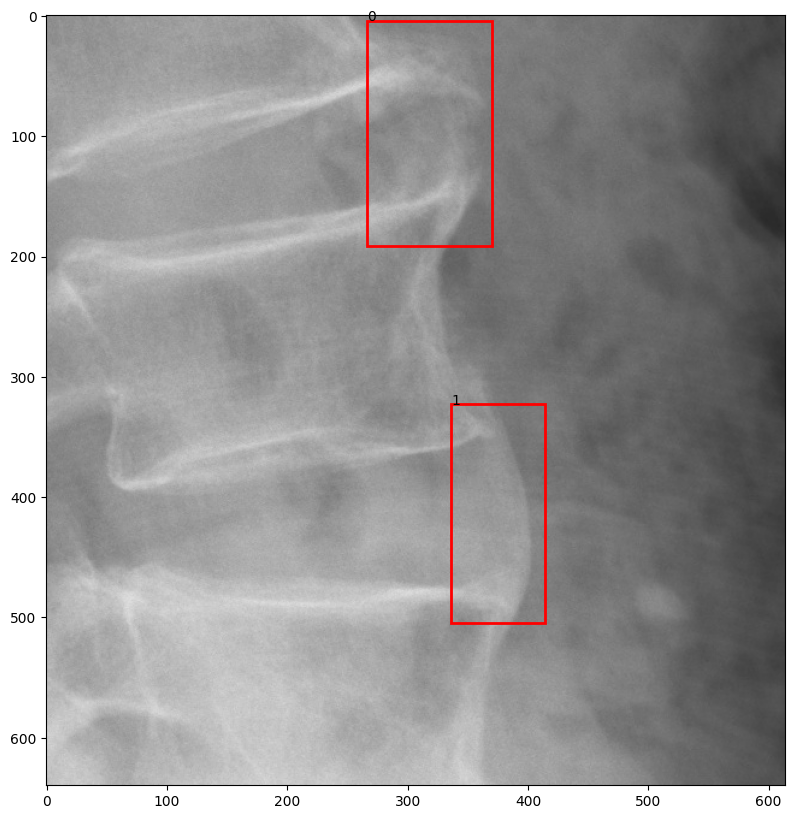

640 640 128 258 323 6 451 264
323 6 128 258


<Figure size 640x480 with 0 Axes>

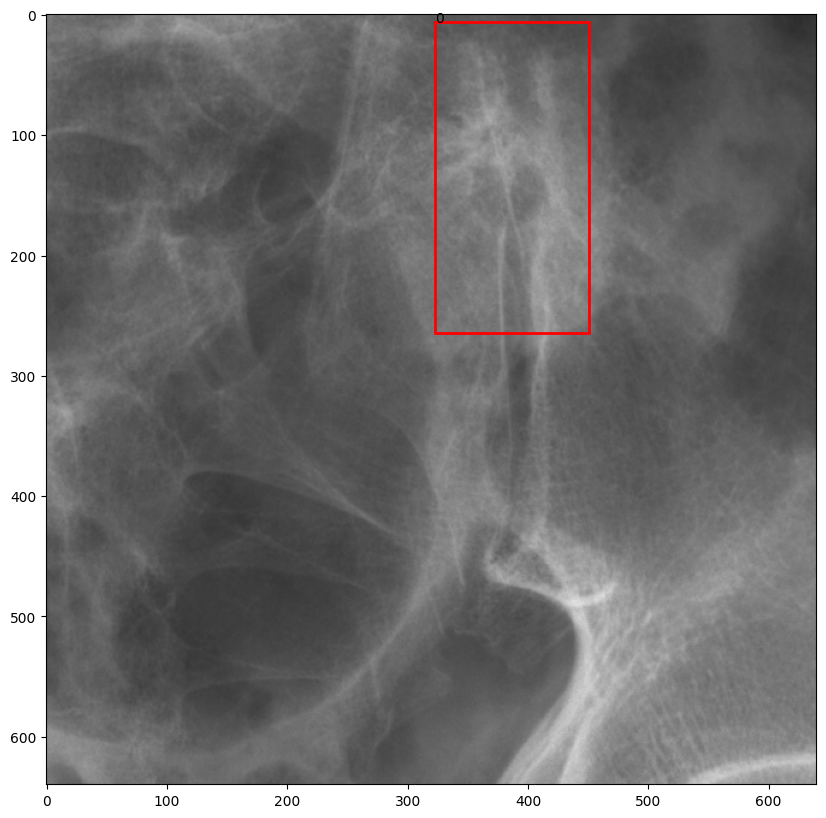

464 640 121 170 386 254 507 424
386 254 121 170


<Figure size 640x480 with 0 Axes>

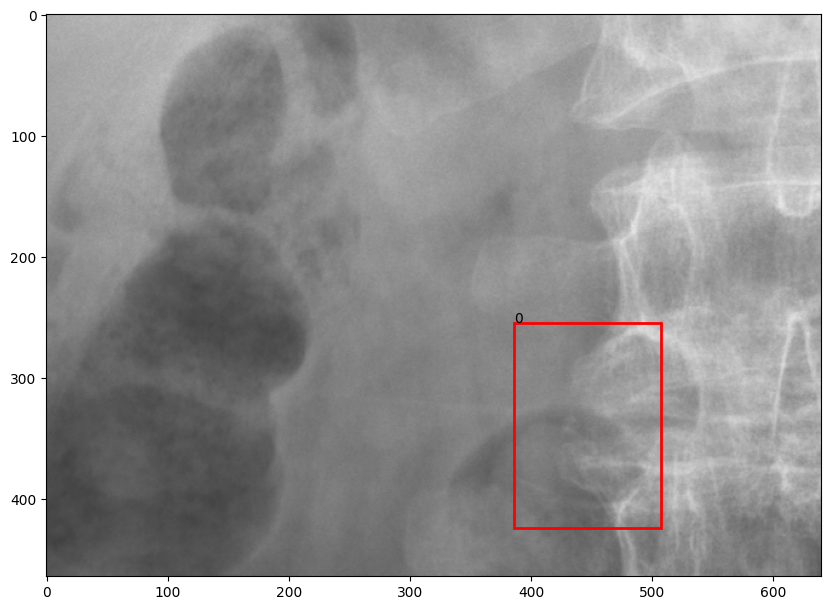

464 640 106 148 124 261 230 409
124 261 106 148


<Figure size 640x480 with 0 Axes>

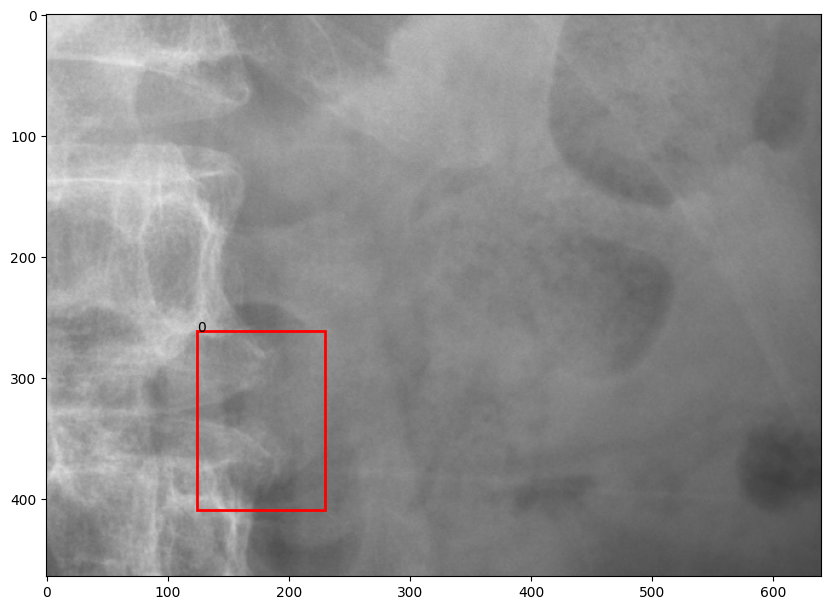

634 640 91 151 412 322 503 473
634 640 98 160 413 47 511 207
412 321 91 152
413 47 98 160


<Figure size 640x480 with 0 Axes>

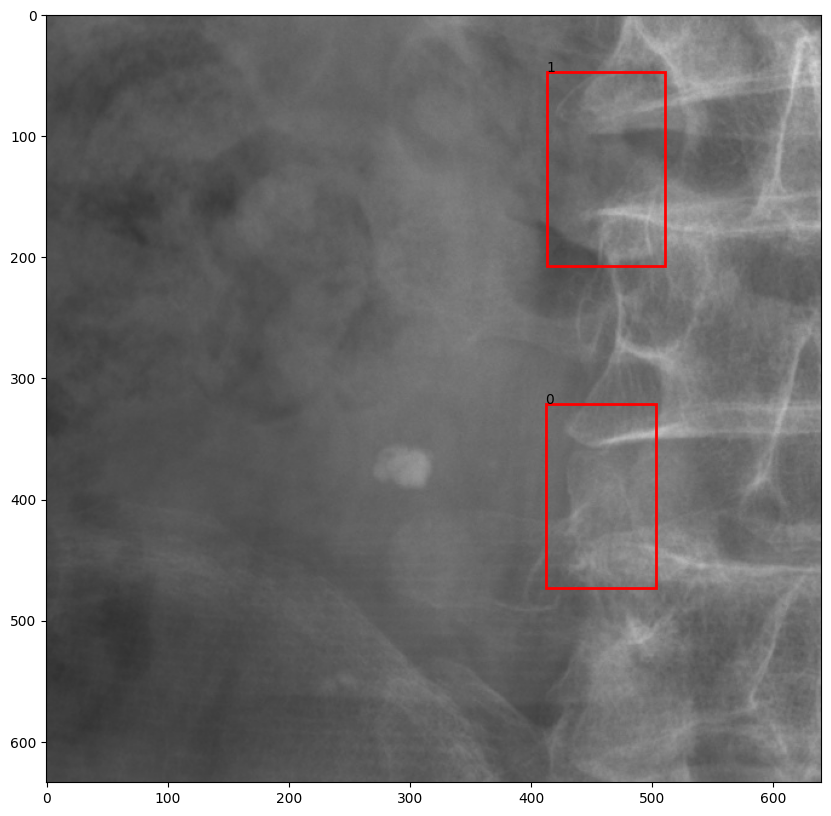

634 640 79 163 153 310 232 473
634 640 116 180 149 6 265 186
153 310 79 163
149 6 116 180


<Figure size 640x480 with 0 Axes>

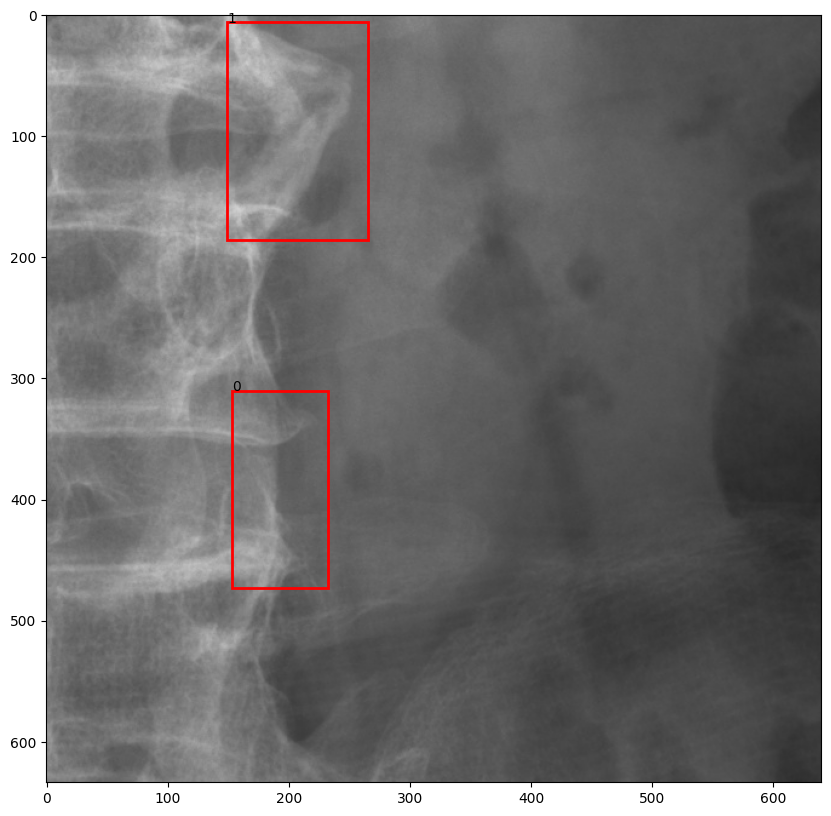

In [ ]:
#Cargar Imagenes
import os
import numpy as np
import pandas as pd
from os import path
import matplotlib.patches as patches
import matplotlib.pylab as plt
from PIL import Image


test_images_or=[]
test_gt_boxes = []
Path="/content/drive/MyDrive/Trabajo_final_VIU/YOLOV8/Dataset/test/"

for Num_img in range(0,10):#len(Lista_imagenes)):
  nombre=Lista_imagenes[Num_img].split(".")
  img = Cargar_imagen(nombre[0],Path+"images")
  test_images_or.append((np.array(img)).astype(np.uint8))
  img2=(np.array(img/255)).astype(np.float32)
  # print((np.array(img/255)).shape)
  # print(img2)
  Data=Generador_data(nombre[0],Path+"labels/")
  # print(Data)
  img_height,img_width=np.array(img).shape[0],np.array(img).shape[1]
  df=[]
  for i in (pd.DataFrame(Data)).index:
          Width = int(float(Data[i][2])*img_width)
          Height= int(float(Data[i][3])*img_height)
          xmin= int((float(Data[i][0])*img_width)- Width/2)
          ymin= int((float(Data[i][1])*img_height) - Height/2)
          xmax= int((float(Data[i][0])*img_width)+ Width/2)
          ymax= int((float(Data[i][1])*img_height) + Height/2)
          print(img_height,img_width,Width,Height,xmin,ymin,xmax,ymax)
          df.append([xmin/img_width,ymin/img_height,xmax/img_width,ymax/img_height])
  test_gt_boxes.append(np.array(df, dtype='f'))
  Graficar(img2,pd.DataFrame(df,columns=["Xmin","Ymin","Xmax","Ymax"]))
  # Graficar(img,pd.DataFrame(Data,columns=["Xcenter","Ycenter","Width","Height"]))


In [ ]:
test_image_tensors=[]
test_gt_box_tensors=[]
for (test_images, test_gt) in zip(test_images_or, test_gt_boxes):
  test_image_tensors.append(tf.expand_dims(tf.convert_to_tensor(test_images, dtype=tf.float32), axis=0))
  test_gt_box_tensors.append(tf.convert_to_tensor(test_gt, dtype=tf.float32))

  # zero_indexed_groundtruth_classes = tf.convert_to_tensor(np.ones(shape=[test_gt_boxes.shape[0]], dtype=np.int32) - label_id_offset)
  # gt_classes_one_hot_tensors.append(tf.one_hot(zero_indexed_groundtruth_classes, num_classes))

In [ ]:
# Graficar(img,pd.DataFrame(Data,columns=["Xmin","Ymin","Xmax","Ymax"]))
def Graficar2(img,df,score,category_index):

  # Imagen Principal
  plt.clf()
  fig, ax = plt.subplots()
  final_image = Image.fromarray((img).astype(np.uint8))
  # Impresión con escala para mejor visualizacion
  fig.set_size_inches(10, 10, forward=True)
  ax.imshow(final_image, cmap='gray', vmin=0, vmax=255)
  #
  #dibujar puntos de enfermedad
  img_height,img_width=np.array(img).shape[0],np.array(img).shape[1]
  # print(img_height,img_height)
  for i in df.index:
     if(score[i]>=category_index):
      # Create a Rectangle patch
      xmin= int((float(df["Xmin"][i])*img_width))
      ymin= int((float(df["Ymin"][i])*img_height))
      xmax= int((float(df["Xmax"][i])*img_width))
      ymax= int((float(df["Ymax"][i])*img_height))
      Width = xmax-xmin
      Height= ymax-ymin
      print(xmin,ymin,Width,Height)
#     Ver Imagen con Restricciones
      rect = patches.Rectangle((xmin,ymin), int(Width), int(Height), linewidth=2, edgecolor='r', facecolor='none')
      plt.text(xmin, ymin,str(i)+("-")+str(round(score[i],2)),bbox=dict(facecolor='red', alpha=0.5),color="g")
      ax.add_patch(rect)
  plt.show()

In [ ]:
# Download the checkpoint and put it into models/research/object_detection/test_data/

!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz
!tar -xf ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz
!mv ssd_resnet50_v1_fpn_640x640_coco17_tpu-8/checkpoint models/research/object_detection/test_data/

--2023-09-19 03:17:04--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 142.251.162.207, 173.194.215.207, 173.194.216.207, ...
Connecting to download.tensorflow.org (download.tensorflow.org)|142.251.162.207|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 244817203 (233M) [application/x-tar]
Saving to: ‘ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz’

ssd_resnet50_v1_fpn 100%[===================>] 233.48M   175MB/s    in 1.3s    

2023-09-19 03:17:05 (175 MB/s) - ‘ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz’ saved [244817203/244817203]



In [ ]:
version=4
chkcons=85

In [ ]:
# tf.keras.backend.clear_session()

# print('Building model and restoring weights for fine-tuning...', flush=True)
# num_classes = 1
# pipeline_config = 'models/research/object_detection/configs/tf2/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.config'
# checkpoint_path = '/content/drive/MyDrive/Trabajo_final_VIU/resnet/ckptTFM'+str(version)+("-")+str(chkcons)+str(-1)
# # checkpoint_path = '/content/drive/MyDrive/Trabajo final VIU/Resources/Model/Model2/ckpt1.5-1'
# print(checkpoint_path)
# # ckpt-2-49.0-1'

# # Load pipeline config and build a detection model.
# #
# # Since we are working off of a COCO architecture which predicts 90
# # class slots by default, we override the `num_classes` field here to be just
# # one (for our new rubber ducky class).
# configs = config_util.get_configs_from_pipeline_file(pipeline_config)
# model_config = configs['model']
# model_config.ssd.num_classes = num_classes
# detection_model = model_builder.build(model_config=model_config,is_training=False)
# ckpt = tf.compat.v2.train.Checkpoint(model=detection_model)
# ckpt.restore(checkpoint_path).expect_partial()

# print('Weights restored!')

In [ ]:
#Este Si
tf.keras.backend.clear_session()

print('Building model and restoring weights for fine-tuning...', flush=True)
num_classes = 1
pipeline_config = 'models/research/object_detection/configs/tf2/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.config'
# checkpoint_path = 'models/research/object_detection/test_data/checkpoint/ckpt-0'
checkpoint_path = '/content/drive/MyDrive/Trabajo_final_VIU/resnet/ckptTFM4-85-1'

# Load pipeline config and build a detection model.
#
# Since we are working off of a COCO architecture which predicts 90
# class slots by default, we override the `num_classes` field here to be just
# one (for our new rubber ducky class).
configs = config_util.get_configs_from_pipeline_file(pipeline_config)
model_config = configs['model']
model_config.ssd.num_classes = num_classes
model_config.ssd.freeze_batchnorm = True
detection_model = model_builder.build(
      model_config=model_config, is_training=False)

# Set up object-based checkpoint restore --- RetinaNet has two prediction
# `heads` --- one for classification, the other for box regression.  We will
# restore the box regression head but initialize the classification head
# from scratch (we show the omission below by commenting out the line that
# we would add if we wanted to restore both heads)
fake_box_predictor = tf.compat.v2.train.Checkpoint(
    _base_tower_layers_for_heads=detection_model._box_predictor._base_tower_layers_for_heads,
    # _prediction_heads=detection_model._box_predictor._prediction_heads,
    #    (i.e., the classification head that we *will not* restore)
    _box_prediction_head=detection_model._box_predictor._box_prediction_head,
    )
fake_model = tf.compat.v2.train.Checkpoint(
          _feature_extractor=detection_model._feature_extractor,
          _box_predictor=fake_box_predictor)
ckpt = tf.compat.v2.train.Checkpoint(model=detection_model)
ckpt.restore(checkpoint_path)

# # Run model through a dummy image so that variables are created
image, shapes = detection_model.preprocess(tf.zeros([1, 640, 640, 3]))
prediction_dict = detection_model.predict(image, shapes)
_ = detection_model.postprocess(prediction_dict, shapes)
print('Weights restored!')

Building model and restoring weights for fine-tuning...
Weights restored!


318 92 65 128
400 48 94 180


<Figure size 640x480 with 0 Axes>

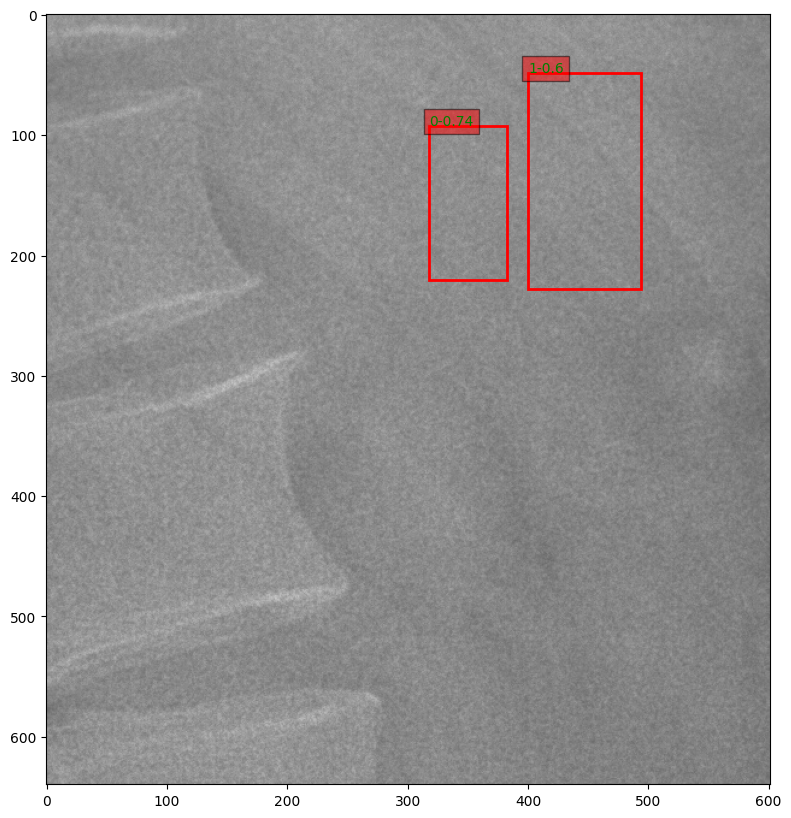

87 338 120 70
45 425 169 100


<Figure size 640x480 with 0 Axes>

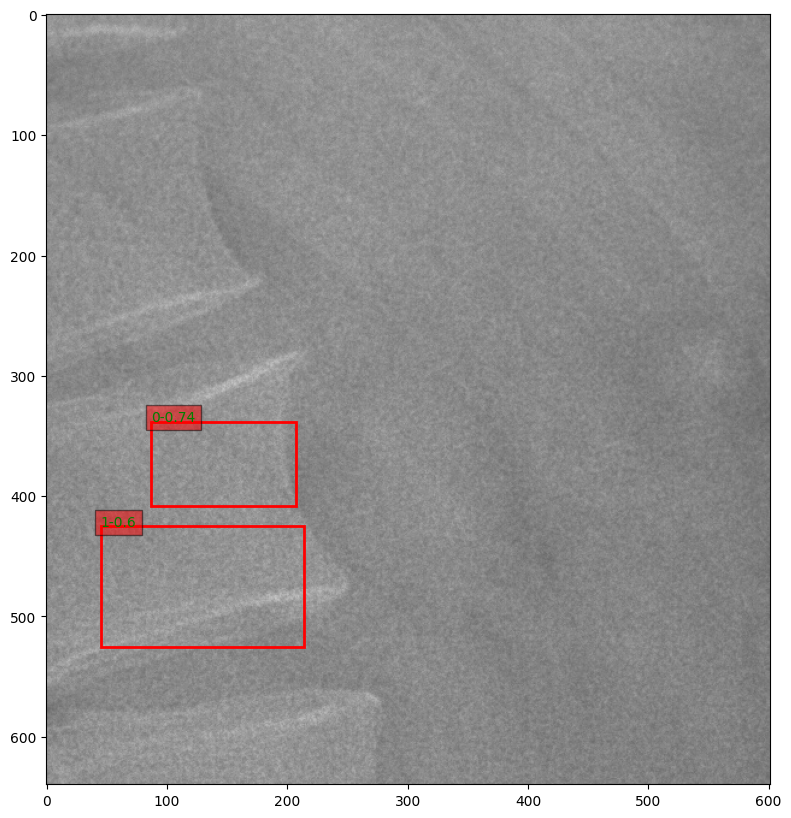

90 113 52 104


<Figure size 640x480 with 0 Axes>

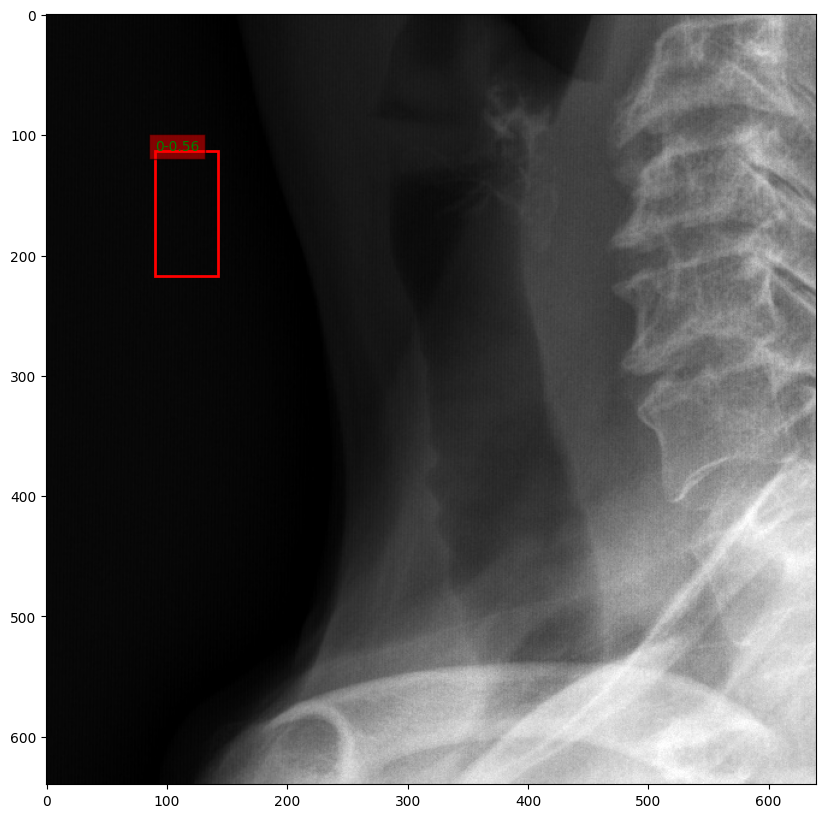

113 90 104 52


<Figure size 640x480 with 0 Axes>

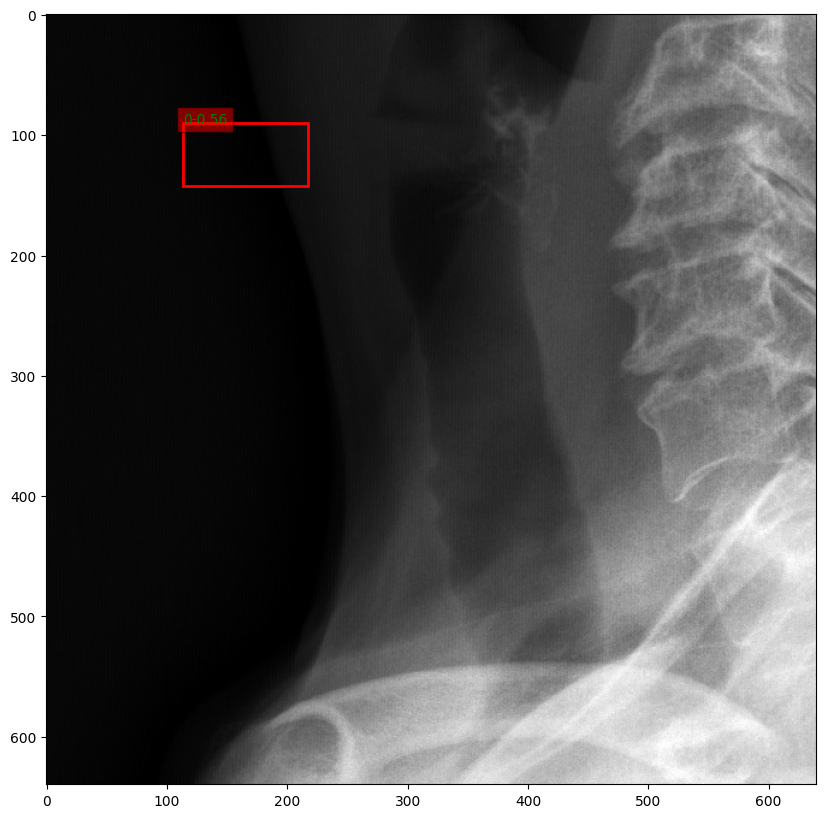

243 212 59 86
249 369 49 80
253 206 65 97
237 377 47 85


<Figure size 640x480 with 0 Axes>

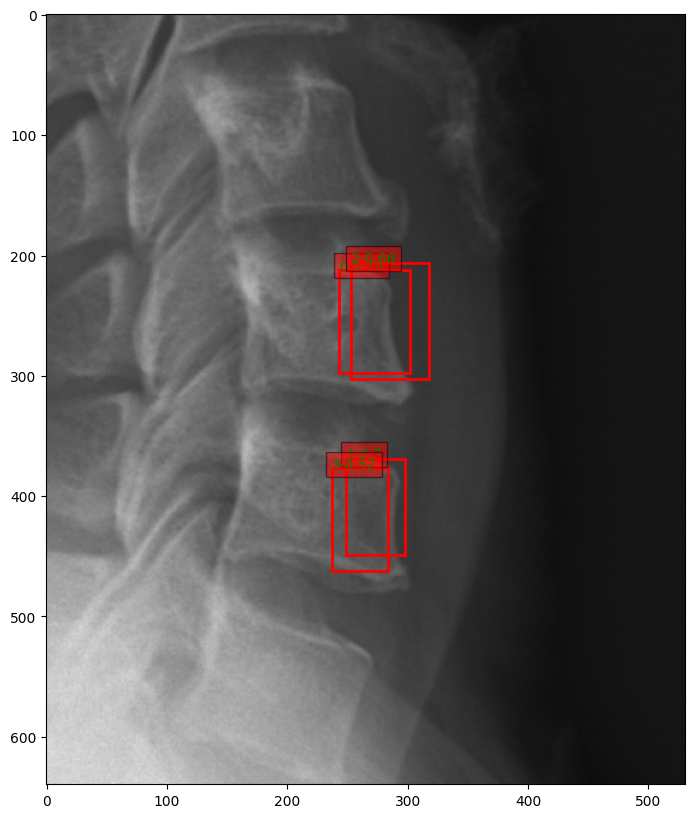

176 294 71 70
306 300 66 59
170 305 81 79
313 286 70 56


<Figure size 640x480 with 0 Axes>

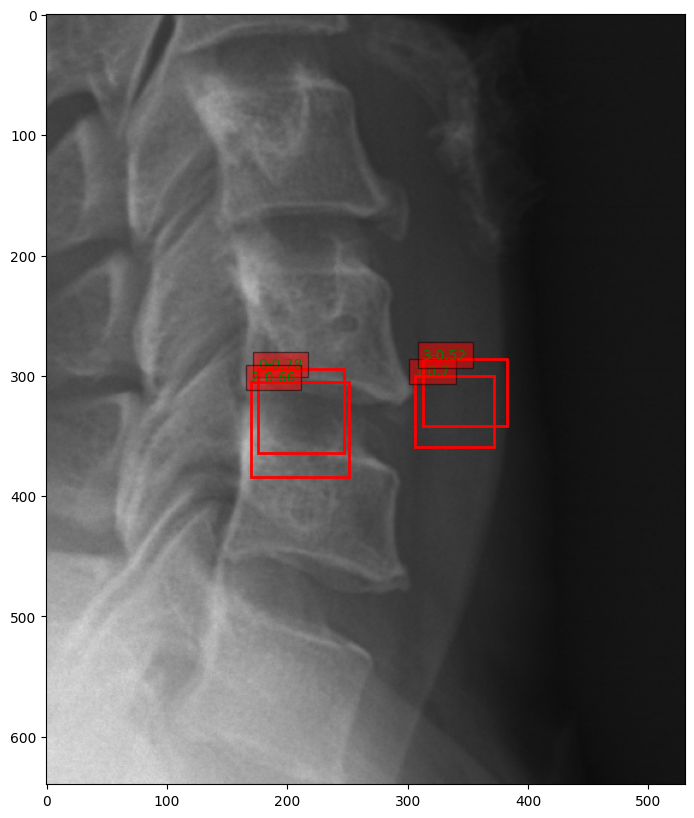

138 95 38 65


<Figure size 640x480 with 0 Axes>

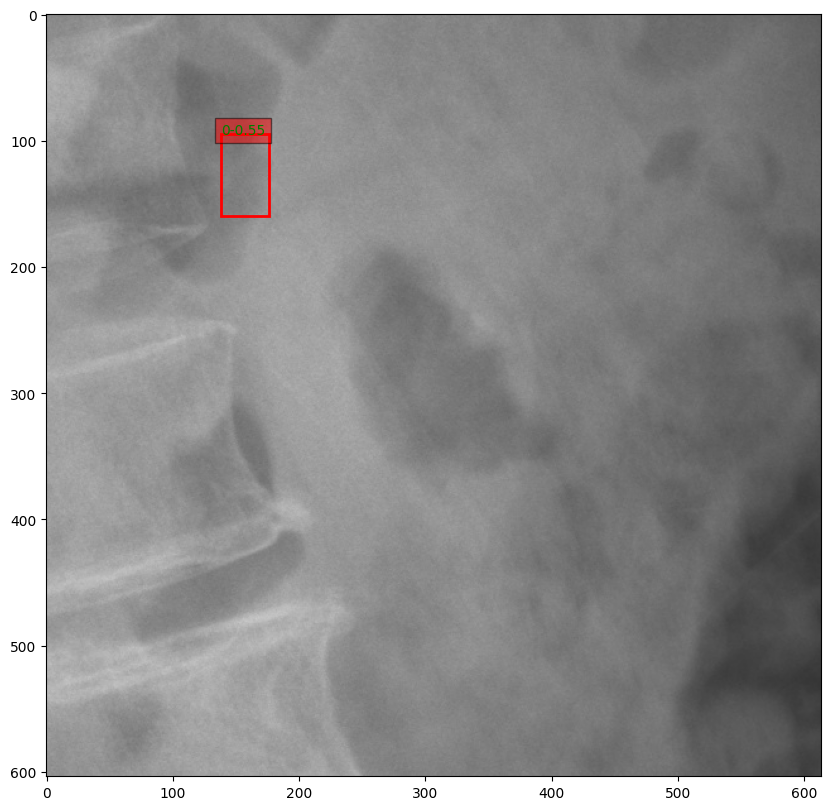

97 136 66 37


<Figure size 640x480 with 0 Axes>

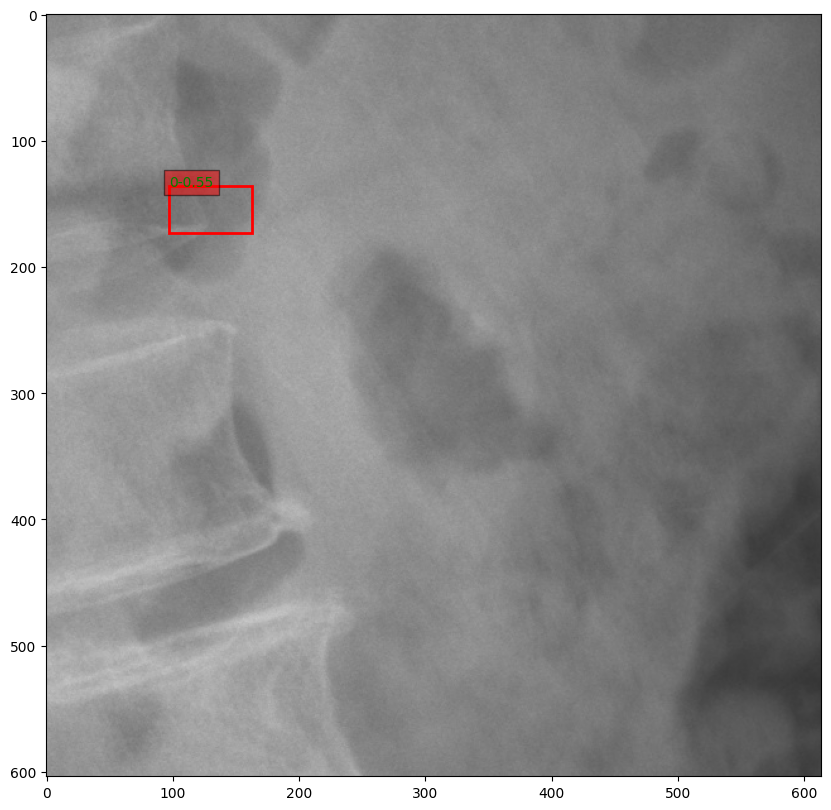

<Figure size 640x480 with 0 Axes>

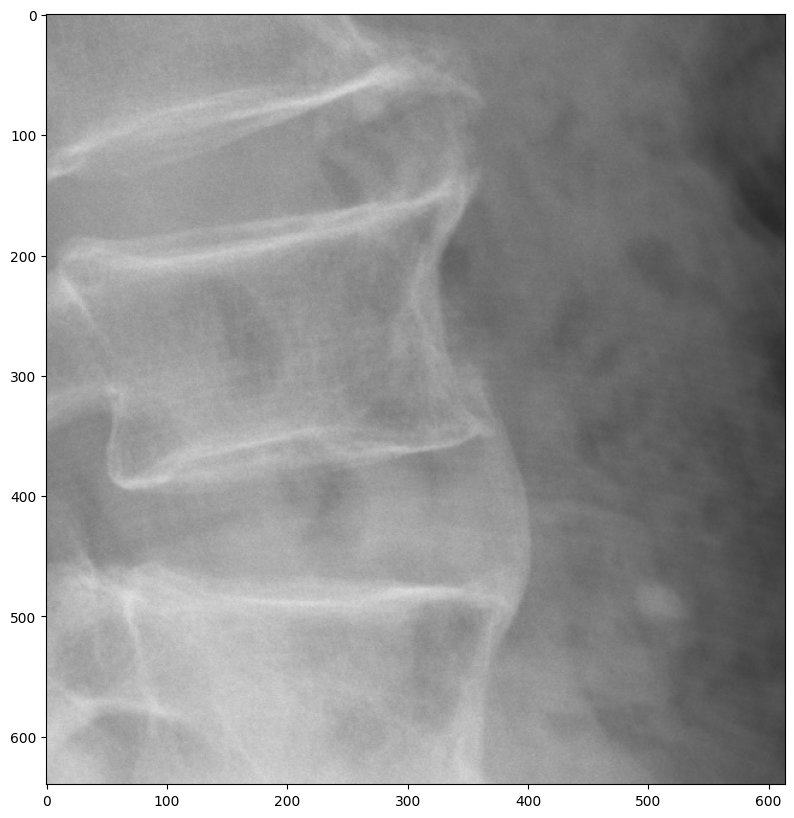

<Figure size 640x480 with 0 Axes>

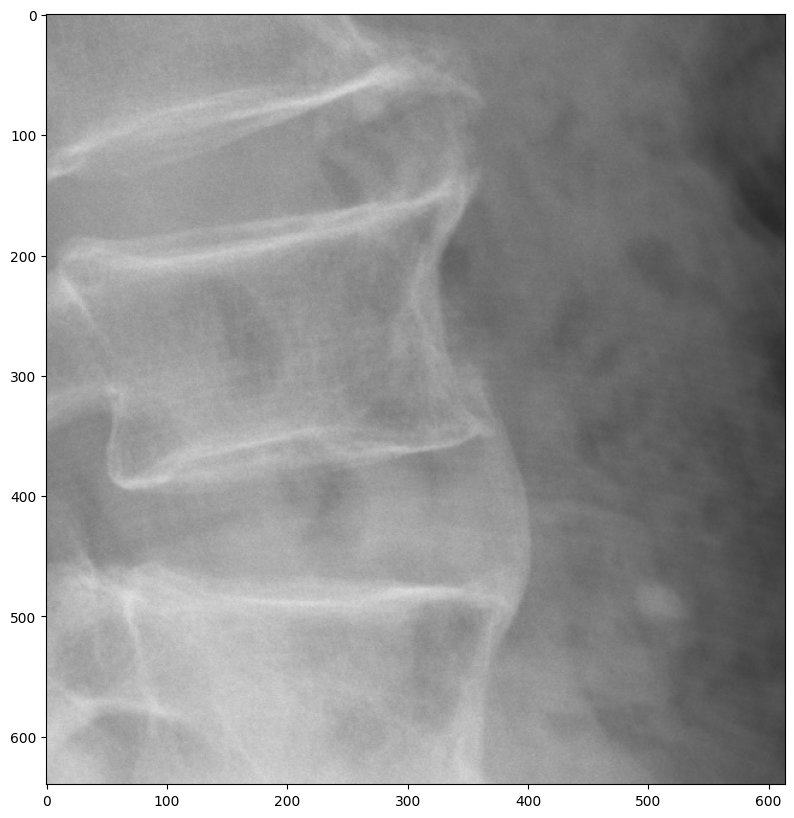

<Figure size 640x480 with 0 Axes>

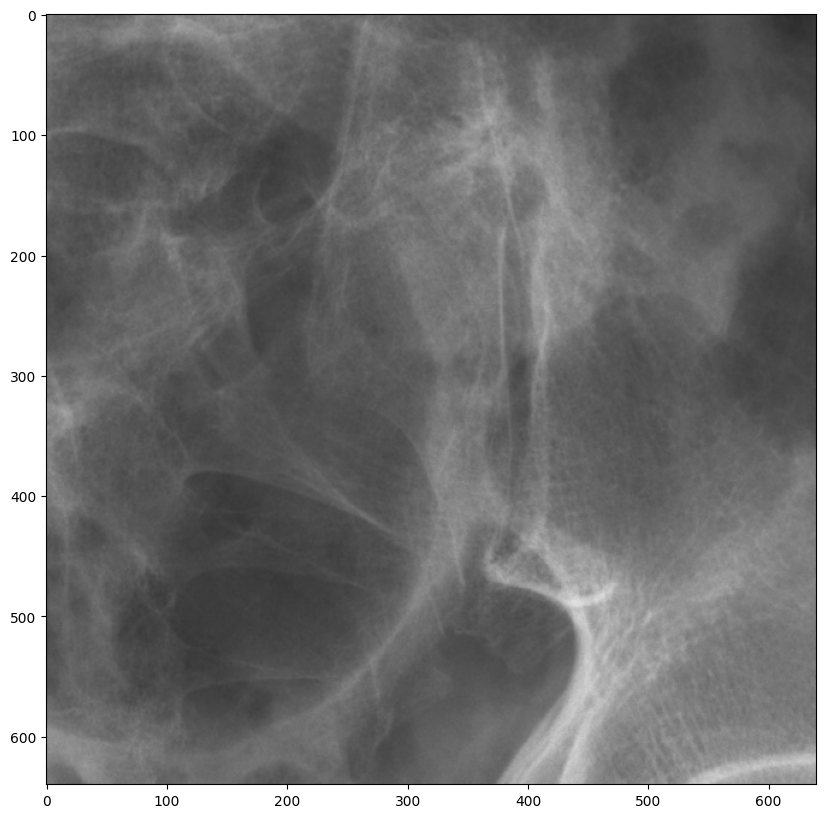

<Figure size 640x480 with 0 Axes>

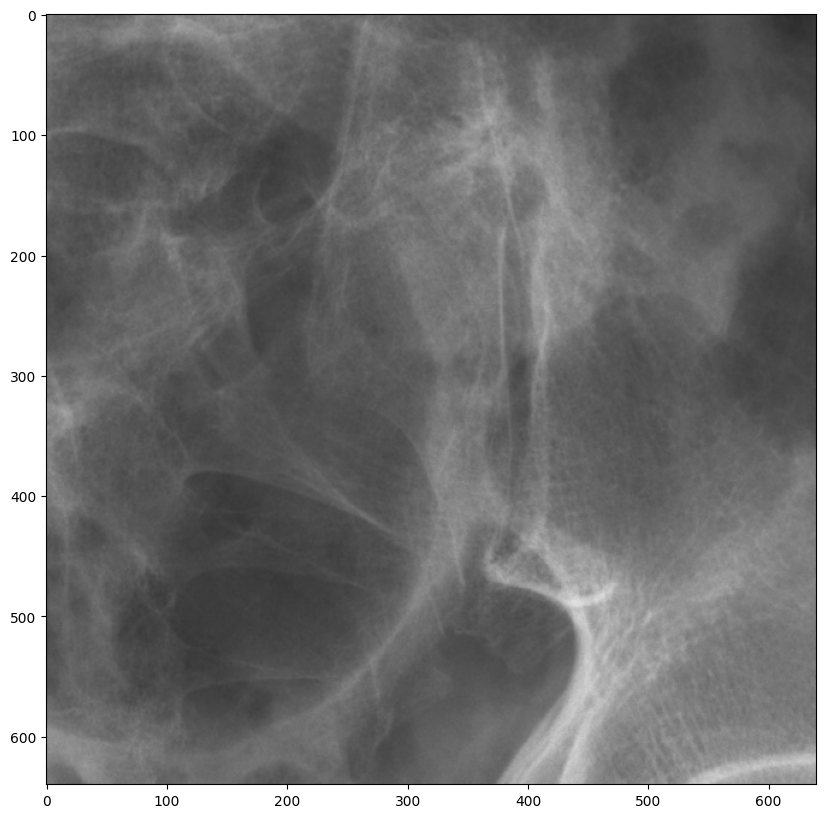

<Figure size 640x480 with 0 Axes>

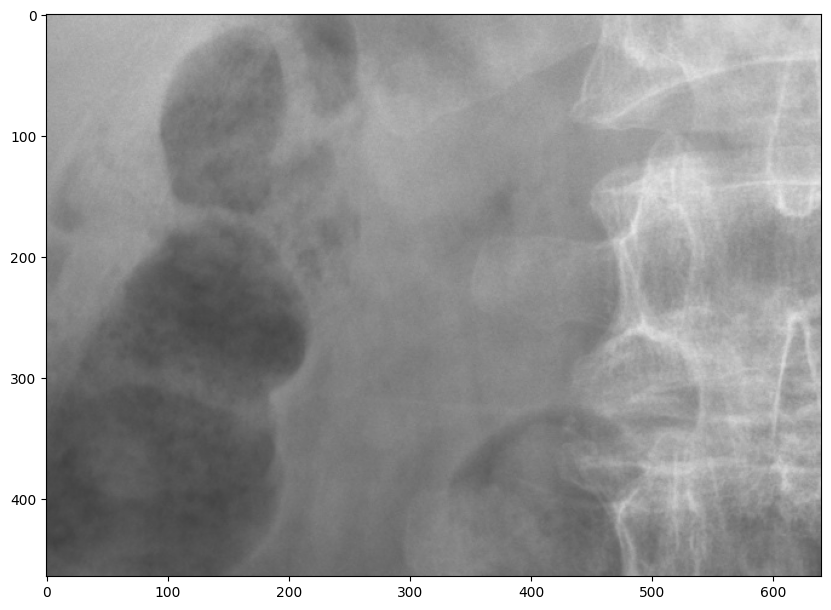

<Figure size 640x480 with 0 Axes>

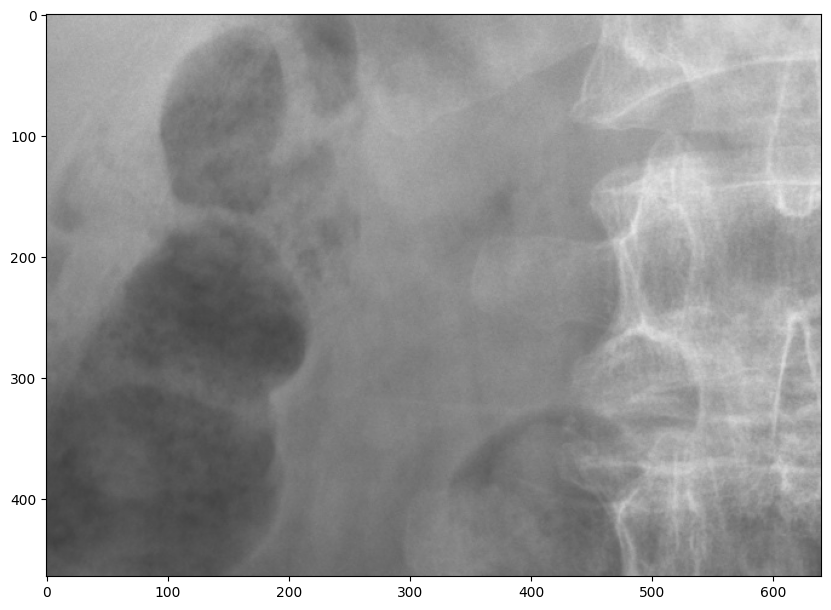

<Figure size 640x480 with 0 Axes>

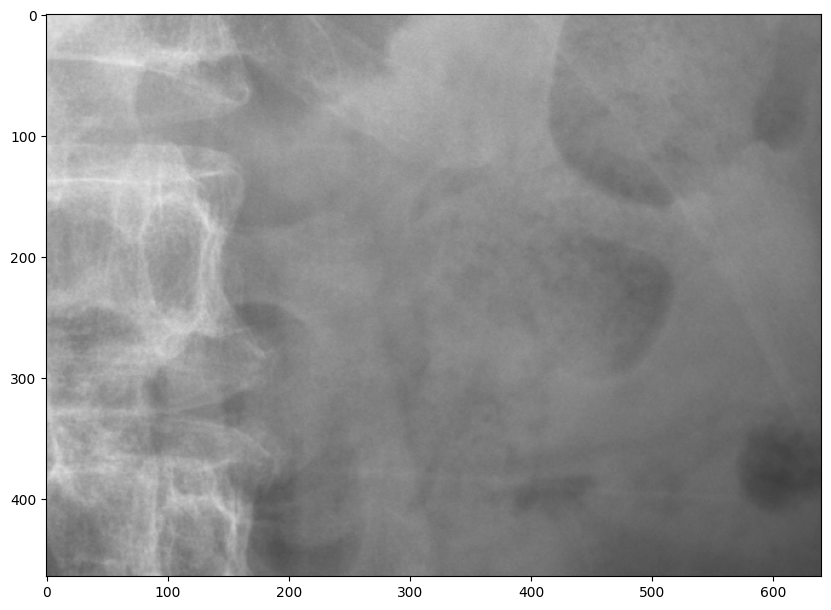

<Figure size 640x480 with 0 Axes>

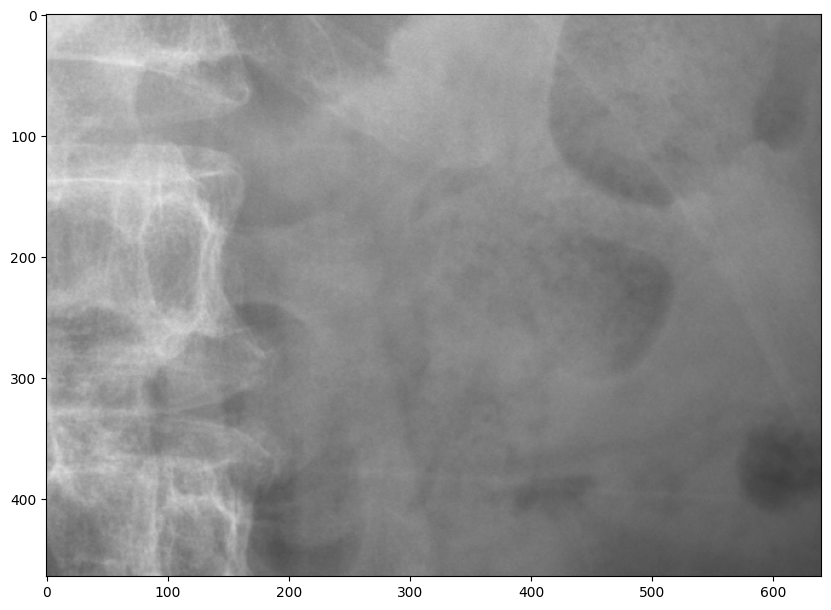

334 0 306 634


<Figure size 640x480 with 0 Axes>

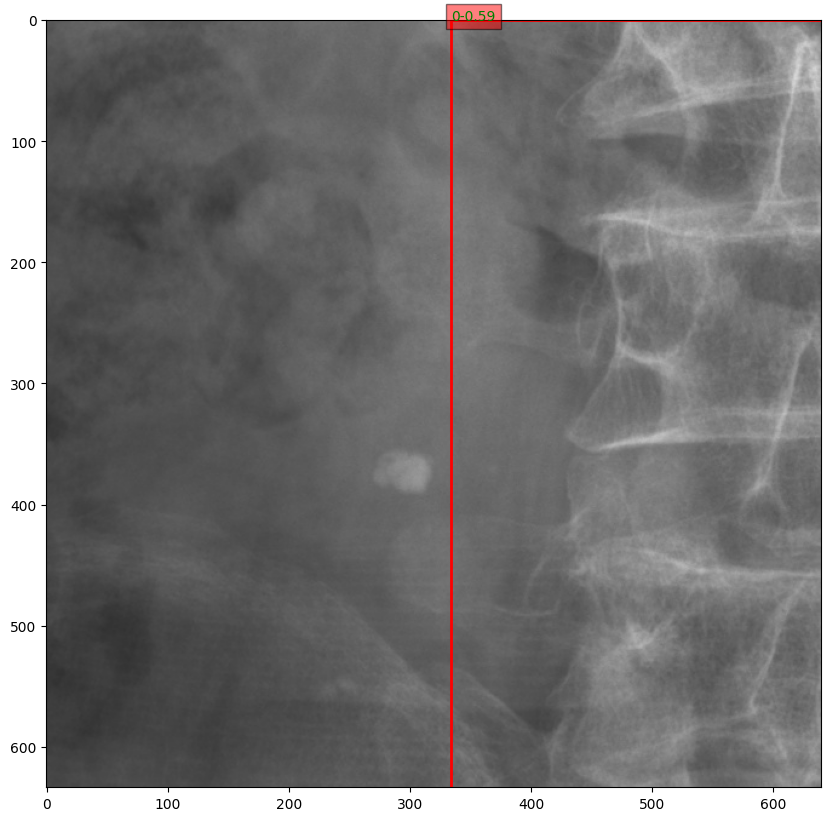

0 331 640 303


<Figure size 640x480 with 0 Axes>

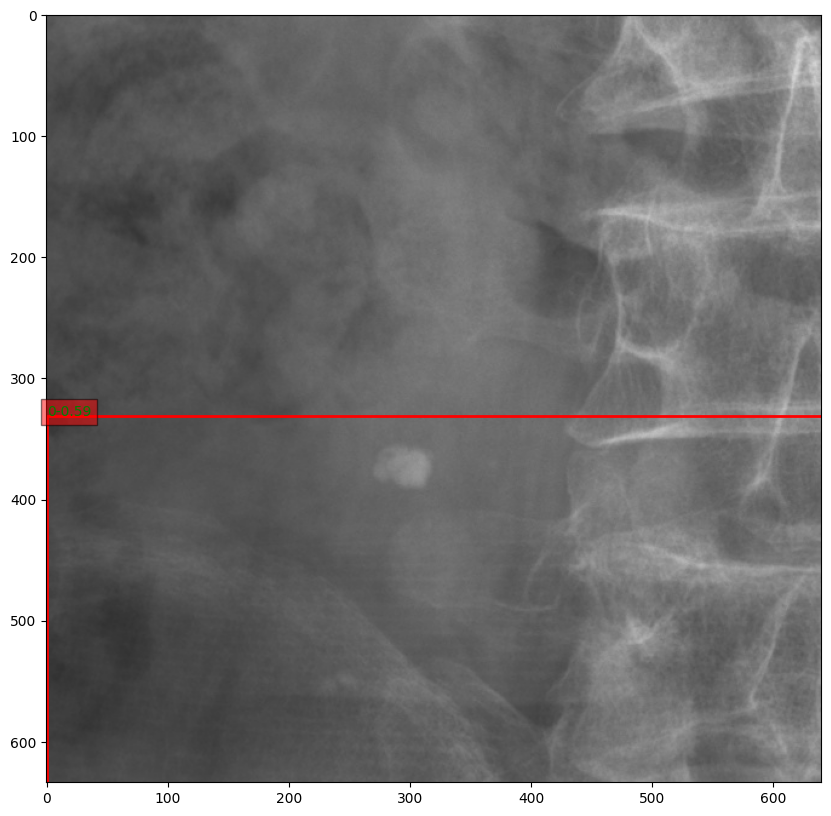

<Figure size 640x480 with 0 Axes>

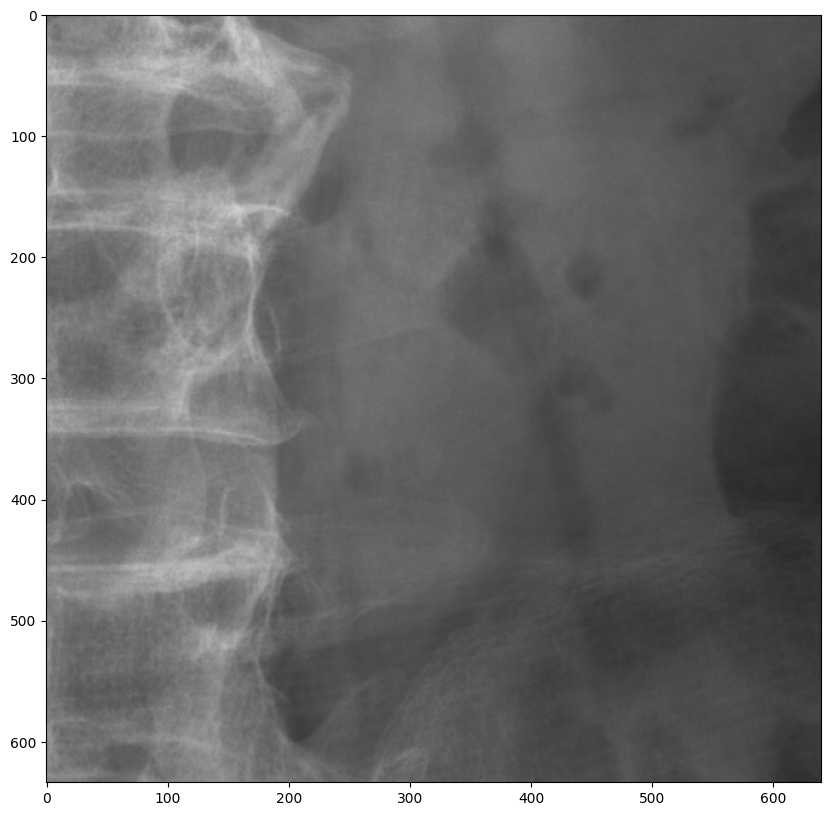

<Figure size 640x480 with 0 Axes>

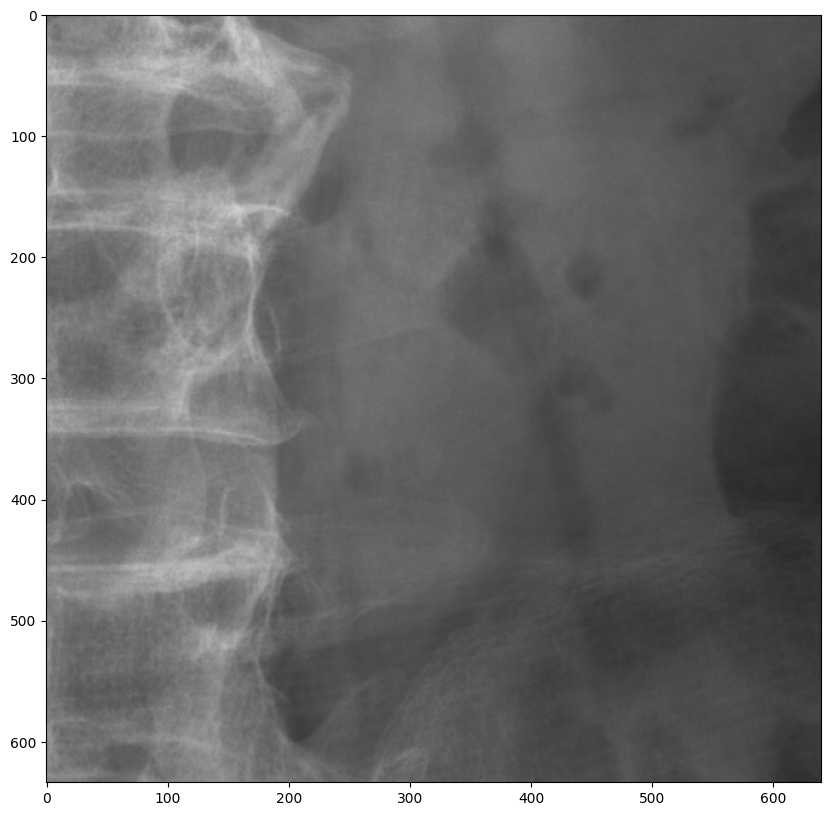

In [ ]:
from PIL import Image
# test_images_np=[]
test_image_dir = "/content/drive/MyDrive/Trabajo_final_VIU/YOLOV8/Dataset/test/"
# for i in range(len(test_images_or)):
#   image_path = os.path.join(test_image_dir, 'out' + str(i) + '.jpg')
#   test_images_np.append(np.expand_dims(
#       load_image_into_numpy_array(image_path), axis=0))

# Again, uncomment this decorator if you want to run inference eagerly
@tf.function
def detect(input_tensor):
  """Run detection on an input image.

  Args:
    input_tensor: A [1, height, width, 3] Tensor of type tf.float32.
      Note that height and width can be anything since the image will be
      immediately resized according to the needs of the model within this
      function.

  Returns:
    A dict containing 3 Tensors (`detection_boxes`, `detection_classes`,
      and `detection_scores`).
  """
  preprocessed_image, shapes = detection_model.preprocess(input_tensor)
  prediction_dict = detection_model.predict(preprocessed_image, shapes)
  return detection_model.postprocess(prediction_dict, shapes)

# Note that the first frame will trigger tracing of the tf.function, which will
# take some time, after which inference should be fast.

label_id_offset = 1
for i in range(len(test_image_tensors)):
  detections = detect(test_image_tensors[i])
  Graficar2(test_images_or[i],pd.DataFrame(detections['detection_boxes'][0],columns=["Ymin","Xmin","Ymax","Xmax"]),detections['detection_scores'][0].numpy(),0.5)
  Graficar2(test_images_or[i],pd.DataFrame(detections['detection_boxes'][0],columns=["Xmin","Ymin","Xmax","Ymax"]),detections['detection_scores'][0].numpy(),0.5)

In [ ]:
import os
import numpy as np
BASE_FOLDER="/content/drive/MyDrive/Trabajo_final_VIU/YOLOV8/Dataset/test/"
Lista_imagenes = os.listdir(BASE_FOLDER+'images/')
Lista_imagenes.sort()
print(len(Lista_imagenes))

1664


In [ ]:
Osteophytes_id = 1

num_classes = 1

category_index = {Osteophytes_id: {'id': Osteophytes_id, 'name': 'Osteophytes'}}

0


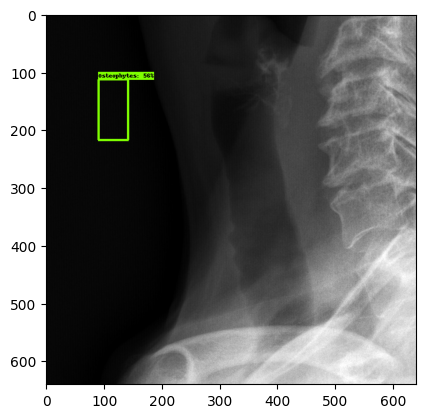

1


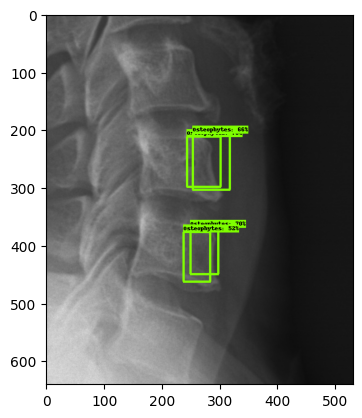

2


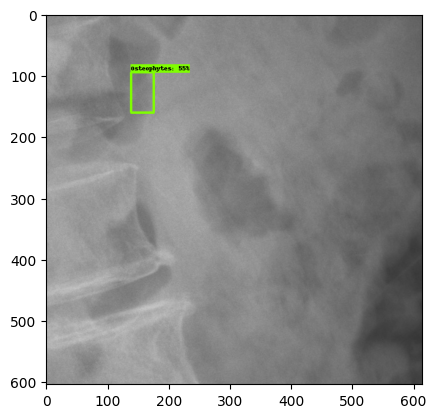

3


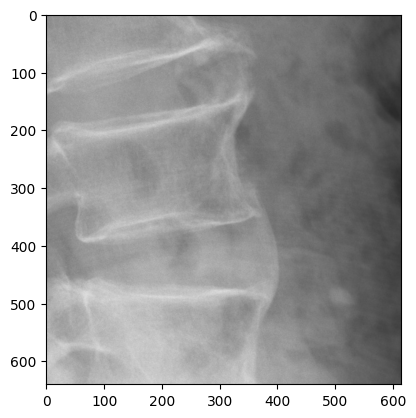

In [ ]:
train_image_dir = "/content/drive/MyDrive/Trabajo_final_VIU/YOLOV8/Dataset/test/images/"
train_images_np = []
for i in range(0, 5):
  image_path = os.path.join(train_image_dir,str(Lista_imagenes[i]))
  train_images_np.append(np.expand_dims(load_image_into_numpy_array(image_path), axis=0))
# Again, uncomment this decorator if you want to run inference eagerly
@tf.function
def detect(input_tensor):
  """Run detection on an input image.

  Args:
    input_tensor: A [1, height, width, 3] Tensor of type tf.float32.
      Note that height and width can be anything since the image will be
      immediately resized according to the needs of the model within this

      function.

  Returns:
    A dict containing 3 Tensors (`detection_boxes`, `detection_classes`,
      and `detection_scores`).
  """
  preprocessed_image, shapes = detection_model.preprocess(input_tensor)
  prediction_dict = detection_model.predict(preprocessed_image, shapes)
  return detection_model.postprocess(prediction_dict, shapes)

# Note that the first frame will trigger tracing of the tf.function, which will
# take some time, after which inference should be fast.

label_id_offset = 1
for i in range(len(train_images_np)):
  input_tensor = tf.convert_to_tensor(train_images_np[i], dtype=tf.float32)
  detections = detect(input_tensor)
  print(i)
  plot_detections(
      train_images_np[i][0],
      detections['detection_boxes'][0].numpy(),
      detections['detection_classes'][0].numpy().astype(np.uint32)
      + label_id_offset,
      detections['detection_scores'][0].numpy(),
      category_index, figsize=(15, 20), image_name=None)
  plt.show()

In [ ]:
detections['detection_scores'][0].numpy()

In [ ]:
detections['detection_boxes'][0]

In [ ]:
test_images_or[0].shape()



In [ ]:
img_height,img_width=np.array(img).shape[0],np.array(img).shape[1]

In [ ]:
print(img_height)
print(img_width)

In [ ]:
test_images_or[0]
print((test_images_or[0].shape))
plt.clf()
fig, ax = plt.subplots()
final_image = test_images_or[0]
# Impresión con escala para mejor visualizacion
fig.set_size_inches(10, 10, forward=True)
ax.imshow(final_image, cmap='gray', vmin=0, vmax=255)

In [ ]:
display(detections)

In [ ]:
  # i=0
  # plot_detections(
  #     test_images_or[i],
  #     detections['detection_boxes'][0].numpy(),
  #     detections['detection_classes'][0].numpy().astype(np.uint32)
  #     + label_id_offset,
  #     detections['detection_scores'][0].numpy(),
  #     category_index, figsize=(15, 20))